# 10. Style Transfer

Сегодня рассмотрим два подхода для переноса стиля и будем делать красивые картиночки.

В 2015 году Гатис с коллегами выдали статью [A Neural Algorithm of Artistic Style](https://arxiv.org/pdf/1508.06576.pdf) и понеслось.

## План
1. Оптимизируем изображение (Gatys et al)
2. Оптимизируем стилиста (Johnson et al)

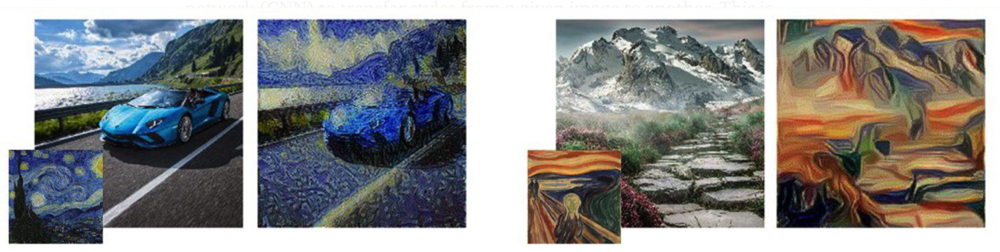

## 1. Оптимизируем изображение (Gatys et al)


**Кратко**: имеем ImageNet-сеть и картинку стиля - **оптимизируем** желанную **картинку** (sic!) под нужный стиль

### 1.1. Как это работает

**Что мы называем переносом стиля?**

Переносом стиля мы считаем процесс изменения стиля (сюда входят цветовая гамма, размер, направление и текстура мазков, etc) входного изображения в соответствии со стилем изображения-источника_стиля, при этом сохраняя основной контент нашего изображения. Короче, нарисовано должно быть то же самое, но по-другому.

На самом деле наш медленный алгоритм будет работать с тремя изображениями:

  * входным (тут может быть шум, но лучшие та же картинка-контент),
  * изображением-контентом (с него мы будем копировать "сюжет"),
  * изображением-стилем (отсюда будем вытаскивать стиль.)

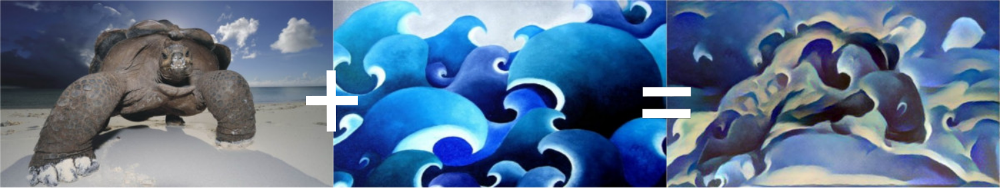

**При чем тут сетки?**

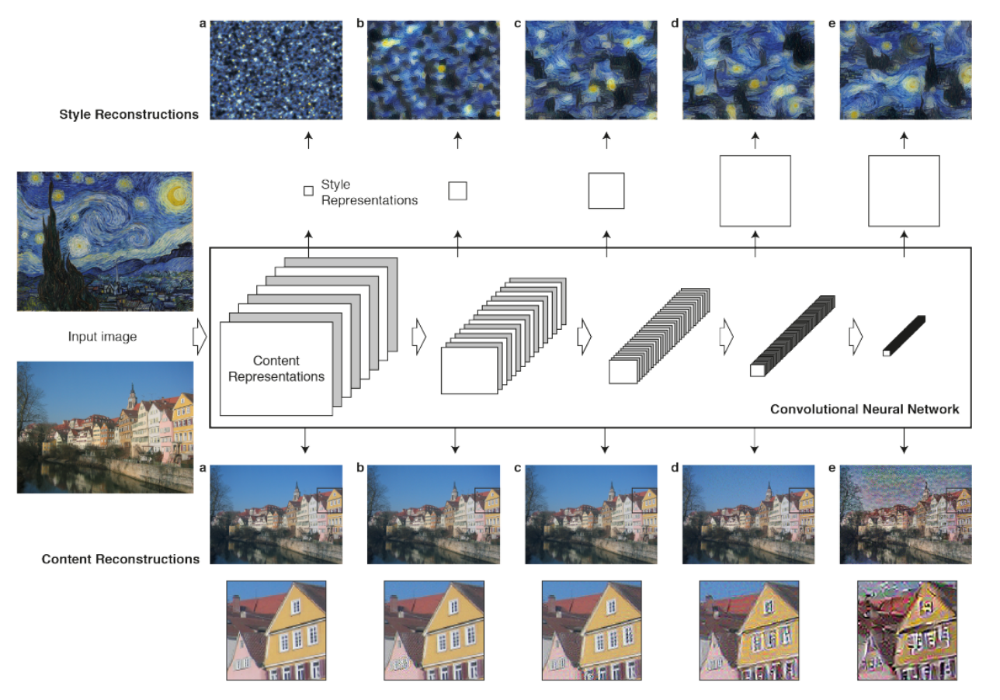

**Как использовать две картинки**: 

Чтобы при генерации использовать данные с обоих изображений - контента и стиля, нужно определить два разных (!) расстояния (они же будут частями лосса) - $D_c$ и $D_s$. Почему разных? Очевидно, что контент и стиль играют разные роли - одно нам надо копировать сюжетно, а у второго взять только общие черты - текстуры/цвета. 

Что означают эти расстояния: 
- $D_s$ будет условно показывать насколько близки стили подаваемых картинок (а на самом деле конволюционные представления на разных этапах), 
- $D_c$ - насколько они близки сюжетно, obviously. 

И чего будем с ними делать? А будем брать нашу входную картинку и **изменять её** таким образом, чтобы расстояния по стилю и контенту стали минимальны. 

**Важный note**: в данном случае при оптимизации `loss`-а мы **не будем** менять веса модели - она священна и неизменна, уже прекрасно делает свою работу (получает представления). Мы меняем сам **вход** модели и оптимизацию проводим именно по его элементам.

**Важный note 2**: в качестве входного изображения можно брать чисто шум, но лучшие и более шустрые результаты получаются если вход = контент + шум. 



**Итак, по пунктикам:**

1. Читаем картинки стиля и контента, приводим их к одному размеру
2. Берем предобученную сеть (`VGG16`)
3. Разделим слои сети - в зависимости от глубины они находят разной сложности признаки, нам понадобятся несколько из них
4. Формулируем оптимизационную задачу - собираем `loss` из `content` и `style` частей
5. Минимизируем суммарный `loss` по входной картинке


А теперь, чтобы правда понять, что происходит, мы...

### 1.2. Реализация

In [ ]:
import re
import copy
import time

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt
from collections import namedtuple

import torchvision.models as models
import torchvision.datasets as datasets
import torchvision.transforms as transforms

from torch.utils.data import DataLoader
import tqdm

import warnings
warnings.filterwarnings('ignore')

device = torch.device("cuda:7" if torch.cuda.is_available() else "cpu")
print(device)

In [ ]:
imsize = (512, 512)

init_transform = transforms.Compose([
    transforms.Resize(imsize), 
    transforms.ToTensor()]) 


def image_loader(image_name):
    image = Image.open(image_name)
    image = init_transform(image).unsqueeze(0) #делаем из картинки батч размера 1
    return image.to(device, torch.float)


content_img = image_loader("./content.jpeg")
style_img = image_loader("./mosaic.jpg")

assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"

In [ ]:
untransform = transforms.ToPILImage()  

def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # для визуализации копируем тензор чтобы не испортить его
    image = image.squeeze(0)      # а 4я размерность стала не нужна
    image = untransform(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)

In [ ]:
plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

**Теперь loss.** Начнем с контента.

`Content loss `- функция, которая выдает взвешенное контентное расстояние для выхода отдельного слоя сетки. На вход она получает фичамапу входа $X$ со слоя $L$ - $F_{XL}$ и считает расстояние от $X$ до $C$ (в финальном лоссе ещё на вес умножим). Но понятное дело расстояние будем считать не до самой $C$, а до её представления на этом же слое - $F_{CL}$. 

То есть $D_S = ‖F_{XL}−F_{CL}‖^2$ и легко считается с помощью `pytorch`.

In [ ]:
def compute_content_loss(features_inputs, features_targets):
    return F.mse_loss(features_inputs, features_targets.detach())

**Погнали про стиль.**

`Style loss` в целом похож на `Content` - он тоже будет жить между слоями и считать разницу между $N$-м представлением стиля и входа. Но здесь разницу мы будем считать между матрицами Грама $G_{XL}$. 

Как мы знаем, матрица Грама - это просто произведение $AA^T$. Для нашего кейса будем считать матрицу Грама для решейпнутых представлений $\hat{F}_{XL}$. Зачем она тут? Базово, мы хотим чтобы хорошо воспроизводились корреляции пар фичей, которые мы наблюдаем в картинке стиля.

Как получаем $\hat{F}_{XL}$: $F_{XL}$ мы решейпим к виду $KxN$, где $K$ - число фичамап (каналов) на слое $L$, а $N$ - длина любой векторизованной (`flatten`) фичамапы. То есть каждая строка $\hat{F}_{XLi}$ - это `flatten` $i$-ая фичамапа. 

В конце каждый элемент матрицы Грама надо нормализовать - поделить на число элементов в матрице, так мы не будем иметь проблем ни с какой размерностью фичамап.



In [ ]:
def compute_gram_matrix(features):
    b, c, h, w = features.size()
    features = features.view(b * c, h * w)  # F_XL -> \hat F_XL
    G = torch.mm(features, features.t())  # считаем матрицу Грама
    return G.div(b * c * h * w) #нормализуем на число объектов

In [ ]:
def compute_style_loss(features_inputs, features_targets):
    return F.mse_loss(compute_gram_matrix(features_inputs), compute_gram_matrix(features_targets.detach()))

Дальше больше - **работаем с моделью**.

Из нее нам нужно уметь вытаскивать фичамапы на нескольких слоях. А также мы помним, что сеть мы не учим, они всегда будет в `eval mode`. 

In [ ]:
means = torch.tensor([0.485, 0.456, 0.406])
stds = torch.tensor([0.229, 0.224, 0.225])

class Normalization(nn.Module):
    def __init__(self, mean=means, std=stds):
        super(Normalization, self).__init__()
        # [C x 1 x 1]
        mean = torch.tensor(mean).view(-1, 1, 1)
        std = torch.tensor(std).view(-1, 1, 1)
        self.register_buffer("mean", mean)
        self.register_buffer("std", std)
        

    def forward(self, img):
        return (img - self.mean) / self.std
    
    @property
    def name(self):
        return "normalization"

In [ ]:
class VGG16FeaturesExtractor(nn.Module):
    
    def __init__(self, output_type="conv", requires_grad=True):
        super(VGG16FeaturesExtractor, self).__init__()
        vgg = models.vgg16_bn(pretrained=True)
        
        model = nn.Sequential()
        
        normalization = Normalization()
        model.add_module("normalization", normalization)
        
        #переименуем слои для наглядности
        i = 0 #будем тут считать блоки по конволюциям
        for layer in vgg.features.children():
            if isinstance(layer, nn.Conv2d):
                i += 1
                name = 'conv_{}'.format(i)
            elif isinstance(layer, nn.ReLU):
                name = 'relu_{}'.format(i)
                layer = nn.ReLU(inplace=True) 
            elif isinstance(layer, nn.MaxPool2d):
                name = 'pool_{}'.format(i)
            elif isinstance(layer, nn.BatchNorm2d):
                name = 'bn_{}'.format(i)
            else:
                raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))
            model.add_module(name, layer)
        
        self.model = model
        
        if output_type not in ("conv", "relu"):
            raise NotImplementedError(output_type)
            
        self.output_type = output_type
        
        self.requires_grad = requires_grad
        if not self.requires_grad:
            for param in self.parameters():
                param.requires_grad = False
        
    def forward(self, x):
        outputs = []
        for name, layer in self.model.named_children():
            x = layer(x)
            if name.startswith(self.output_type):
                outputs.append(x)
        return outputs

In [ ]:
vggfext = VGG16FeaturesExtractor()

In [ ]:
x = torch.randn(1, 3, 512, 512)
y = vggfext(x)
len(y)

for yi in y:
    print(yi.shape)

В статье для стиля брали  `conv1_1` `(1)`, `conv2_1` `(3)`, `conv3_1` `(5)`, `conv4_1` `(8)` и `conv5_1` `(11)`, а для контента `conv4_2` `(9)`

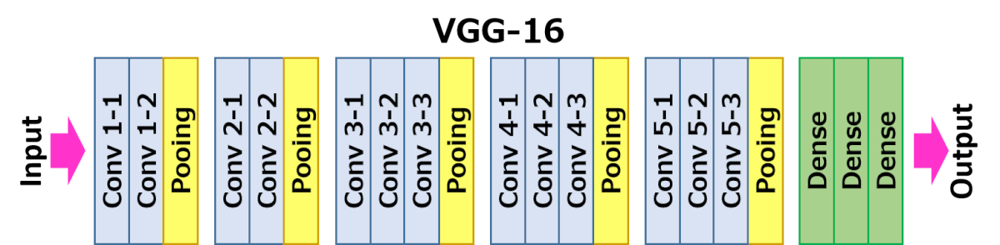

In [ ]:
STYLE_WEIGHT = 1e6
CONTENT_WEIGHT = 1

In [ ]:
CONTENT_LAYERS_INDICES = [8]
STYLE_LAYERS_INDICES = [0, 2, 4, 7, 10]

def apply_style_transfer(content_img, style_img, input_img, 
                         num_steps=300, style_weight=STYLE_WEIGHT, content_weight=CONTENT_WEIGHT, 
                         content_layers_indices=CONTENT_LAYERS_INDICES, style_layers_indices=STYLE_LAYERS_INDICES,
                         device="cpu"):
    optimizer = optim.LBFGS([input_img.requires_grad_()]) #обратите внимание кому нужен градиент
    
    features_extractor = VGG16FeaturesExtractor().eval().to(device)
    
    content_img = content_img.to(device)
    style_img = style_img.to(device)
    input_img = input_img.to(device)
    
    for i in tqdm.trange(num_steps):
        
        def closure():
            input_img.data.clamp_(0, 1)
            
            optimizer.zero_grad()
        
            features_inputs = features_extractor(input_img)
            features_content = features_extractor(content_img)
            features_style = features_extractor(style_img)

            content_loss = 0
            for j in content_layers_indices:
                content_loss += compute_content_loss(features_inputs[j], features_content[j])

            style_loss = 0
            for j in style_layers_indices:
                style_loss += compute_style_loss(features_inputs[j], features_style[j])

            loss = content_loss * content_weight + style_loss * style_weight
            loss.backward()
                        
            return loss

        optimizer.step(closure)
        
    input_img.data.clamp_(0, 1)
            
    return input_img.cpu()

In [ ]:
input_img = content_img.clone()
input_img_noise = torch.randn(content_img.data.size())

plt.figure()
imshow(input_img, title='Input Image')

plt.figure()
imshow(input_img_noise, title='Noise Image')

In [ ]:
output_img = apply_style_transfer(content_img, style_img, input_img, num_steps=16, device=device)

plt.figure()
imshow(output_img, title='Output Image')

## 2. Оптимизируем стилиста (Johnson et al)



**Кратко**: для каждого стиля научим свою `Transform Net`, а `ImageNet`-сеть будем использовать для подсчета `loss` при её обучении (привет, `Perceptual Loss`)

### 2.1. Как это работает

Этот подход был предложен в 2016 году Johnson J, Alahi A. и Fei-Fei Li в статье [Perceptual Losses for Real-Time Style Transfer
and Super-Resolution](https://arxiv.org/pdf/1603.08155.pdf). Статья чёткая и довольно простая в понимании, почитайте для закрепления материала.

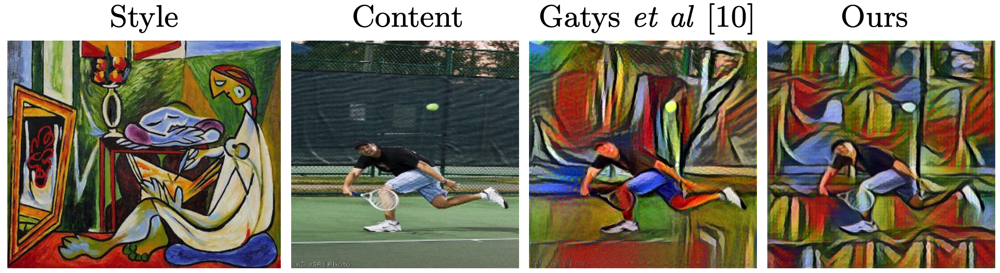

Визуально кажется, что стиль оба подхода передают неплохо, просто по-разному, но основной понт в том, что получаемое ускорение на инференсе - минимум x200. 

Такой подход можно уже использовать в приложениях, которые к нужному вам фото применяют один из заранее выбранных стилей. 

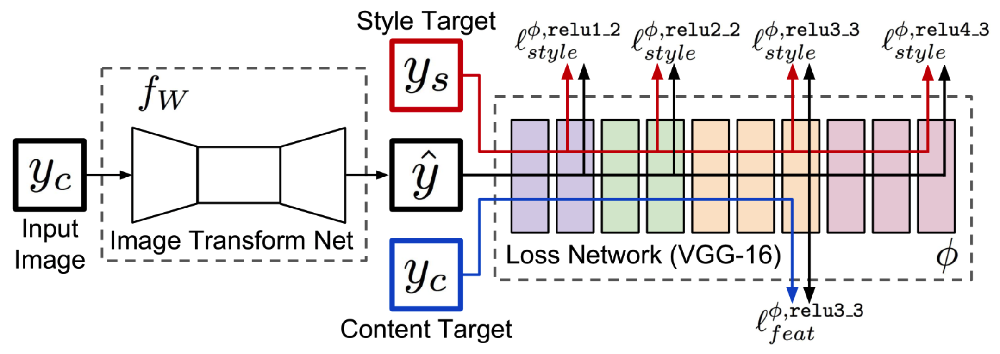

**В чем тут суть?** 

Мы заранее имеем одну картинку стиля, под которую будем выучивать сеть, и какую то выборку визуальных данных, которые можно использовать для обучения (разметки, конечно, никакой нет). 

Сеть мы хотим выучить так, чтобы какой бы ни был инпут, после инференса преобразованная картинка **воспринималась** как имеющая новый стиль. Вот это восприятие стиля картинки и будет делать `ImageNet`-сетка, а такие навороты с восприятием контента и стиля посредством маленького обученного ИИ назвали `Perceptual Loss.`

Лоссы тут на самом деле точно такие же, как мы уже видели - `MSE` между матрицами Грама для стиля, `MSE` попиксельно для представления контента.

**Особенности Transformation Net** (по заветам [статьи](https://arxiv.org/pdf/1511.06434.pdf))

- Архитектура `downsample-upsample`
- Нет `pooling layers` (для `downsamle` иcпользуем `strided conv`)
- `Reflection padding` перед `conv` всегда (чтобы не было артефактов на краях)
- Используются `residual blocks`
- `Instance Normalization`
- Особый `Upsample` (чтобы не было шахматных артефактов)

Здесь в архитектуре сразу используем `Instance Normalization` для улучшения качества, который был предложен в 2016 году господами `Ulyanov D., Lempitsky V., Vedaldi A.` в статье [`Instance Normalization: The Missing Ingredient for Fast Stylization`](https://arxiv.org/pdf/1607.08022.pdf), а код к ней [вот](https://github.com/DmitryUlyanov/texture_nets) (увы, он на lua).

**Зачем down-сэмплить, если потом будем up-сэмплить?** 

Вход и выход у нас одинакового размера, так зачем страдать? Преобразовывали бы входную картинки $C × H × W$ всё время.

А мы уже знаем благодаря UNet, но повторим.

- Вычислительно проще. 3×3 конволюция с $C$ фильтрами на картинке $C × H × W$ - это $9HW C^2$ операций. А это то же самое, что 3 × 3 конволюция с $D*C$ фильтрами на картинке $DC × H/D × W/D$. А значит на тех же затратах мы можем делать сеть глубже и извлекать больше информации из картинки. 
- С понижением размерности, у нас растет `receptive field` сверток, а при стилизации какой-то части изображения, нам нужно знать проиходящее вокруг этой части. Без `downsampling` каждая $3×3$ конволюция увеличивает `receptive field` в 2 раза (это очень маленькие области). При `downsample` в D раз, каждая $3×3$ конволюция на первоначальном изображении имеет  `receptive field` $×2D$, а значит сеть воспринимает одновременно большую часть контекста, при том же числе слоев.


**Instance Normalization**

Сравните доки про [`nn.InstanceNorm2d`](https://pytorch.org/docs/stable/generated/torch.nn.InstanceNorm2d.html) и [`nn.BatchNorm2d`](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm2d.html).

В случае нормализации батча мы считаем `mean/std` по-канально для всего батча и используем общую статистику для всех картинок, в случае нормализации инстанса мы считем `mean/std` по-канально для каждой отдельной картинки в батче, информация между ними не шерится. 

Почему это хорошо? 

К каждой картинке стиль должен применяться **по-своему**, учитывая её уникальный сюжет. Шеринг этих данных внутри батча приводит к единообразию, которое хорошо при классификации, но в искусстве неприменимо.



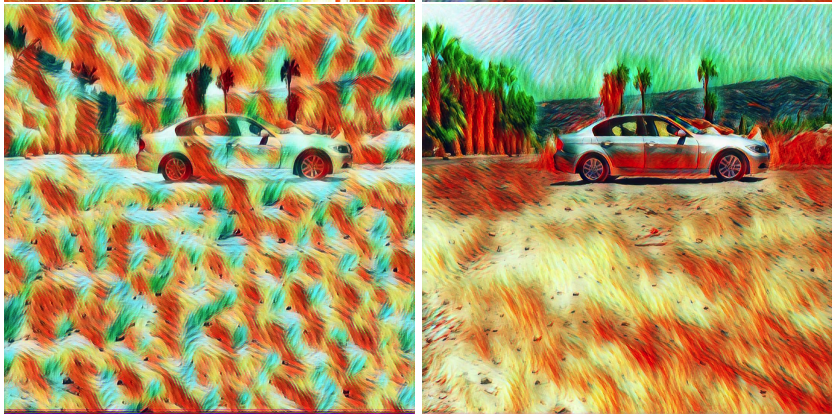

**Upsample trick**

Подробное описание [тут](http://distill.pub/2016/deconv-checkerboard/).

Кратко вспомним: вместо того чтобы выучивать веса для `upsampling` и избегать некратности размера ядра и `stride`, разделим операцию на две части - интерполяцию и конволюцию над ней, это решит проблему.

### 2.2. Реализация

[Ссылка](https://drive.google.com/file/d/18C3Exq2G_mh2xteU-J5TfjvK4KPUwt9D/view?usp=sharing) на данные для вас. 


In [ ]:
batch_size = 8
train_dataset = datasets.ImageFolder('./Flickr8k', init_transform)
train_loader = DataLoader(train_dataset, batch_size=batch_size)

Пишем сеть-"стилиста":

In [ ]:
class StyleTransformerNet(torch.nn.Module):
    def __init__(self):
        super(StyleTransformerNet, self).__init__()
        # Initial convolution layers
        self.conv1 = ConvLayer(3, 32, kernel_size=9, stride=1)
        self.in1 = torch.nn.InstanceNorm2d(32, affine=True)
        self.conv2 = ConvLayer(32, 64, kernel_size=3, stride=2)
        self.in2 = torch.nn.InstanceNorm2d(64, affine=True)
        self.conv3 = ConvLayer(64, 128, kernel_size=3, stride=2)
        self.in3 = torch.nn.InstanceNorm2d(128, affine=True)

        # Residual blocks
        self.res1 = ResidualBlock(128)
        self.res2 = ResidualBlock(128)
        self.res3 = ResidualBlock(128)
        self.res4 = ResidualBlock(128)
        self.res5 = ResidualBlock(128)

        # Upsampling 
        self.deconv1 = UpsampleConvLayer(128, 64, kernel_size=3, stride=1, upsample=2)
        self.in4 = torch.nn.InstanceNorm2d(64, affine=True)
        self.deconv2 = UpsampleConvLayer(64, 32, kernel_size=3, stride=1, upsample=2)
        self.in5 = torch.nn.InstanceNorm2d(32, affine=True)
        self.deconv3 = ConvLayer(32, 3, kernel_size=9, stride=1)

        # нелинейность везде одна
        self.relu = torch.nn.ReLU(inplace=True)
        self.tanh = torch.nn.Tanh()

    def forward(self, X):
        y = self.relu(self.in1(self.conv1(X)))
        y = self.relu(self.in2(self.conv2(y)))
        y = self.relu(self.in3(self.conv3(y)))

        y = self.res1(y)
        y = self.res2(y)
        y = self.res3(y)
        y = self.res4(y)
        y = self.res5(y)

        y = self.relu(self.in4(self.deconv1(y)))
        y = self.relu(self.in5(self.deconv2(y)))
        y = self.deconv3(y)
        y = self.tanh(y)
        return y


class ConvLayer(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride):
        super(ConvLayer, self).__init__()
        reflection_padding = kernel_size // 2
        self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
        self.conv2d = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride)

    def forward(self, x):
        out = self.reflection_pad(x)
        out = self.conv2d(out)
        return out


class ResidualBlock(torch.nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = ConvLayer(channels, channels, kernel_size=3, stride=1)
        self.in1 = torch.nn.InstanceNorm2d(channels, affine=True)
        self.conv2 = ConvLayer(channels, channels, kernel_size=3, stride=1)
        self.in2 = torch.nn.InstanceNorm2d(channels, affine=True)
        self.relu = torch.nn.ReLU()

    def forward(self, x):
        residual = x
        out = self.relu(self.in1(self.conv1(x)))
        out = self.in2(self.conv2(out))
        out = out + residual #skip
        return out


class UpsampleConvLayer(torch.nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, upsample=None):
        super(UpsampleConvLayer, self).__init__()
        self.upsample = upsample
        reflection_padding = kernel_size // 2
        self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
        self.conv2d = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride)

    def forward(self, x):
        x_in = x
        if self.upsample:
            x_in = torch.nn.functional.interpolate(x_in, mode='nearest', scale_factor=self.upsample)
        out = self.reflection_pad(x_in)
        out = self.conv2d(out)
        return out

In [ ]:
style_transformer = StyleTransformerNet()

In [ ]:
x = torch.randn(1, 3, 256, 256)
y = style_transformer(x)
y.size()

In [ ]:
#основная сеть и оптимайзер
style_transformer = StyleTransformerNet()

In [ ]:
init_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor()
])

In [ ]:
#Читаем картинку стиля под которую будем учить сеть
style_img = Image.open('./mosaic.jpg').convert('RGB')

style_img = init_transform(style_img)
style_img = style_img.unsqueeze(0)
print(style_img.shape)

In [ ]:
features_extractor = VGG16FeaturesExtractor(output_type="relu", requires_grad=False)

In [ ]:
features_style = features_extractor(style_img)

for f in features_style:
    print(f.shape)

In [ ]:
#новая функция для работы с батчем
def compute_gram_matrix_batch(y):
    (b, ch, h, w) = y.size()
    features = y.view(b, ch, w * h) #вытягиваем пространственную размерность в вектор
    features_t = features.transpose(1, 2) #транспонируем
    gram = features.bmm(features_t) / (ch * h * w) #batch matrix mul
    return gram

In [ ]:
def compute_style_loss(features_inputs, features_targets):
    return F.mse_loss(compute_gram_matrix_batch(features_inputs), compute_gram_matrix_batch(features_targets.detach()))

In [ ]:
epochs = 2
optimizer = optim.Adam(style_transformer.parameters(), 1e-3)
content_weight = 1e5
style_weight = 1e12

In [ ]:
CONTENT_LAYERS_INDICES = [5]
STYLE_LAYERS_INDICES = [2, 3, 5, 9]

def train_style_transformer(train_loader, style_transformer, features_style,
                            features_extractor, num_epochs, optimizer,
                            style_weight, content_weight, content_layers_indices=CONTENT_LAYERS_INDICES, style_layers_indices=STYLE_LAYERS_INDICES,
                            device="cpu"):
    
    style_transformer.train().to(device)
    features_extractor.eval().to(device)
    features_style = [f.to(device) for f in features_style]
    
    for epoch in range(num_epochs):
        
        agg_content_loss = 0.
        agg_style_loss = 0.
        
        for i, (batch, _) in tqdm.tqdm(enumerate(train_loader), total=len(train_loader)):
            batch = batch.to(device)
            features_input = features_extractor(batch)
            
            batch_transformed = style_transformer(batch)
            features_transformed = features_extractor(batch_transformed)
            
            content_loss = 0.
            for j in content_layers_indices:
                content_loss += compute_content_loss(features_transformed[j], features_input[j])

            style_loss = 0.
            for j in style_layers_indices:
                style_loss += compute_style_loss(features_transformed[j], features_style[j])

            loss = content_loss * content_weight + style_loss * style_weight
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            agg_content_loss += content_loss.item() * content_weight
            agg_style_loss += style_loss.item() * style_weight

            if (i + 1) % 64 == 0:
                mesg = "{} Epoch {}: content: {:.6f} style: {:.6f} total: {:.6f}".format(
                    time.ctime(), epoch + 1,
                                  agg_content_loss / (i + 1),
                                  agg_style_loss / (i + 1),
                                  (agg_content_loss + agg_style_loss) / (i + 1))
                print(mesg)
                
    return features_transformed, features_input, features_style

In [ ]:
features_transformed, features_input, features_style = train_style_transformer(train_loader, style_transformer, features_style, features_extractor, epochs, optimizer, style_weight, content_weight, device=device)

In [ ]:
%%time
style_transformer.eval()
with torch.no_grad():
    output_fast = style_transformer(content_img).cpu()

output_fast *= 255
output_fast = output_fast.squeeze(0).clamp(0, 255).numpy()
output_fast = output_fast.transpose(1, 2, 0).astype("uint8")

In [ ]:
fig = plt.figure(figsize=(20, 10))
plt.axis('off')
plt.imshow(output_fast)